In [90]:
from re import U
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches
from icecream import ic # for printing/debugging
import pandas as pd

import patchify as pat
from pathlib import Path

# import custom modules
import NavigatingTheMatrix as nvm
import As_detection as asd

# importlib allows to reload the module if changes have been made to it without having to restart the whole kernel
import importlib

In [321]:
# load desired matrix file and make an STM object from NavigatingTheMatrix file
cwd = Path.cwd() # current working directory

path = cwd / 'hainault_examples' / '20200212-183707_Hainault-Si(001)-H--38_1.Z_mtrx'

scan = nvm.STM( str(path) , None, None, None, standard_pix_ratio=512/100)
    

In [322]:
# clean up the scans

scan.clean_up(scan.trace_up, 'trace up', plane_level=True)
scan.clean_up(scan.retrace_up, 'retrace up', plane_level=True)

scan.clean_up(scan.trace_down, 'trace down', plane_level=True)
scan.clean_up(scan.retrace_down, 'retrace down', plane_level=True)

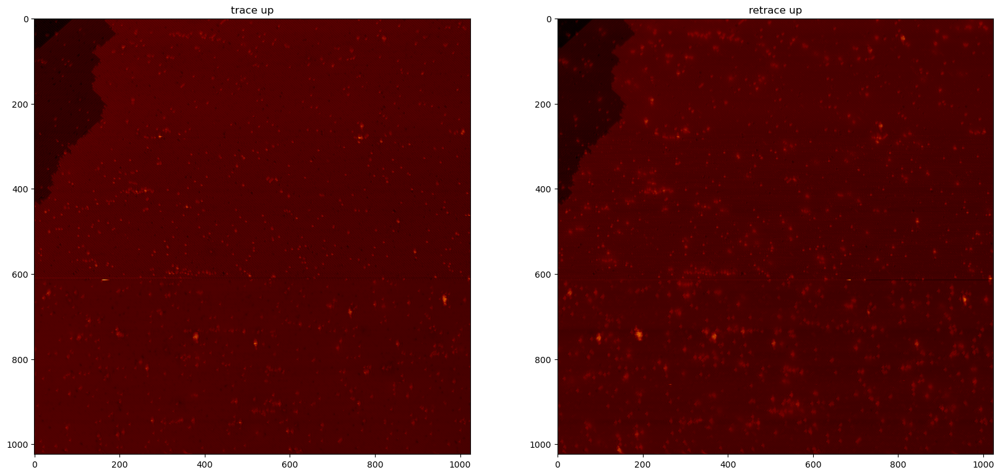

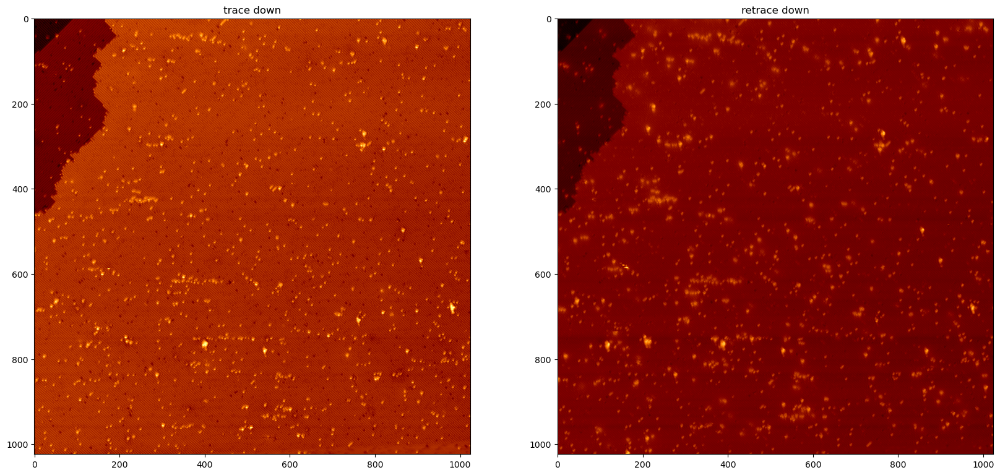

In [216]:
# plot the cleaned up scans and choose whether to use trace up or down
# (Viewing with gwyddion provides better quality images for inspection in my opinion)

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(scan.trace_up_proc, cmap='afmhot')
ax[0].set_title('trace up')
ax[1].imshow(scan.retrace_up_proc, cmap='afmhot')
ax[1].set_title('retrace up')
plt.show()

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(scan.trace_down_proc, cmap='afmhot')
ax[0].set_title('trace down')
ax[1].imshow(scan.retrace_down_proc, cmap='afmhot')
ax[1].set_title('retrace down')
plt.show()

In [323]:
# correct hysteresis
scan.trace_up_proc, scan.retrace_up_proc, corrected = scan.correct_hysteresis(scan.trace_up_proc, scan.retrace_up_proc, 'trace up')   
scan.trace_down_proc, scan.retrace_down_proc, corrected = scan.correct_hysteresis(scan.trace_down_proc, scan.retrace_down_proc, 'trace down')
   

Number of matches found for hysteresis correction: 6 . If it's only a few (less than ~3) the correction will not be very accurate.
Number of matches found for hysteresis correction: 15 . If it's only a few (less than ~3) the correction will not be very accurate.


<module 'As_detection' from 'c:\\Users\\nkolev\\OneDrive - University College London\\Documents\\GitHub\\NavigatingTheMatrix\\As_detection.py'>

In [ ]:
importlib.reload(asd)

In [325]:
# make a Si_scan object just for trace down
trace_up = asd.Si_Scan(scan, 'trace up', As=True) # As = False if not dosed yet
trace_down = asd.Si_Scan(scan, 'trace down', As=True)

Resolution of image is 1024
Resolution of image is 1024


In [326]:
# make detector object to find and label defects
detector = asd.Detector()

In [327]:
# run prediction
trace_down.one_hot_segmented = detector.predict(trace_down, As = True)

Number of features is 1210


In [328]:
# turn output into rgb image
trace_down.rgb = detector.turn_rgb(trace_down.one_hot_segmented)

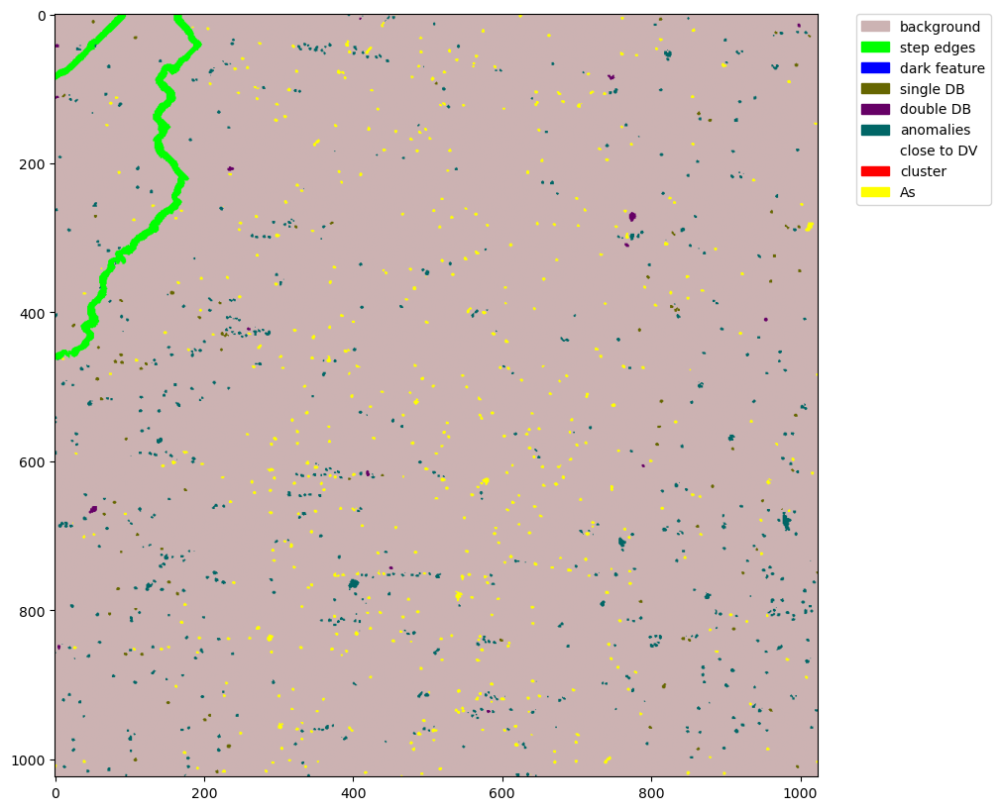

In [329]:
# show image
plt.figure(figsize=(10,10))
plt.imshow(trace_down.rgb)

# order of output2: background, step edges, dv, 1DB, 2DB, anomalies, CDV,  As features (if present)

# Create custom legend handles
legend_handles = []
for rgb, label in detector.legend.items():
    color = np.array(rgb)  # Normalize RGB values to [0, 1] for Matplotlib
    patch = mpatches.Patch(color=color, label=label)
    legend_handles.append(patch)

# Add the custom legend to the plot
plt.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


plt.show()

In [224]:
# find distance between all features then use this to filter for whatever features you want
trace_down.feature_dists()
# all distances are now save in a dictionary which can be accessed by trace_down.features
# keys are the different features in the scan (NOT the feature type). The features are numbered in the order they were found (so keys are 0, 1, 2, 3, etc.)
# values are feature objects (see As_detection.py for more info). Each feature object has things like feature.coord, feature.feature_type
#for key in trace_down.features.keys():
    #print('key:', key)
#    print('coord: {}, feature type: {}'.format(trace_down.features[key].coord, trace_down.features[key].feature_type))



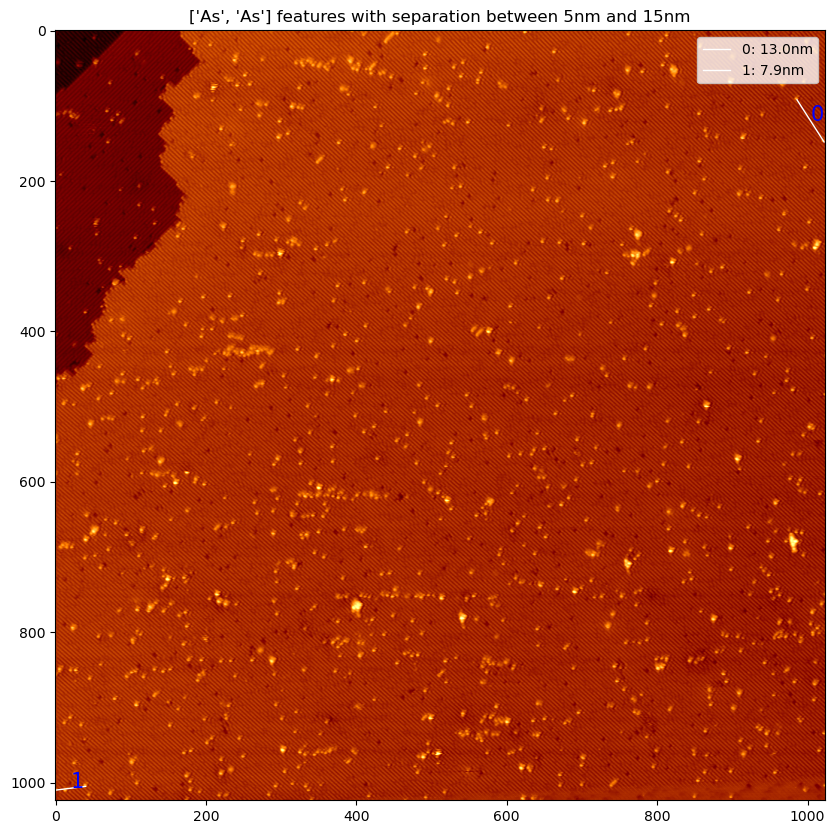

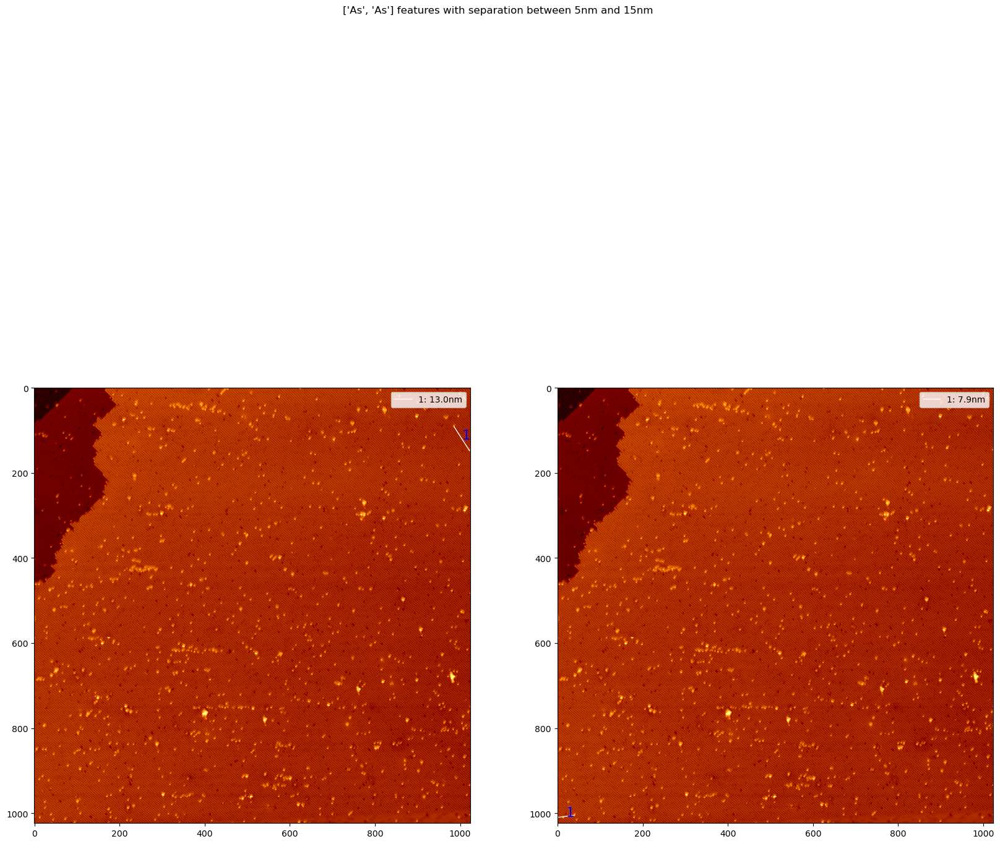

In [228]:
# find all As dopnats that are at a distance of 15nm-20nm from each other
As_to_As = trace_down.find_pairs('As', 'As', max_dist = 15, min_dist = 5, exclusion_dist=15, display_image=True)
#ic(As_to_As) # print results too


In [242]:
# find all As dopnats that are at a distance of 15nm-20nm from each other
As_to_As = trace_down.find_pairs('As', 'As', max_dist = 10, min_dist = 5, display_image=True)
#ic(As_to_As) # print results too

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x000001CB67F21AB0> (for post_execute):


KeyboardInterrupt: 

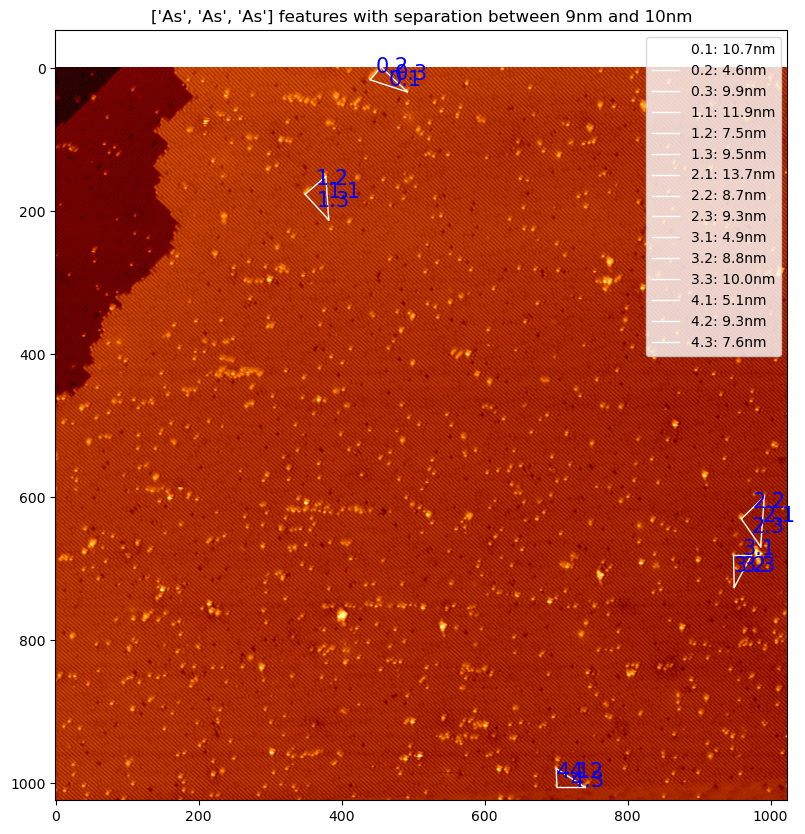

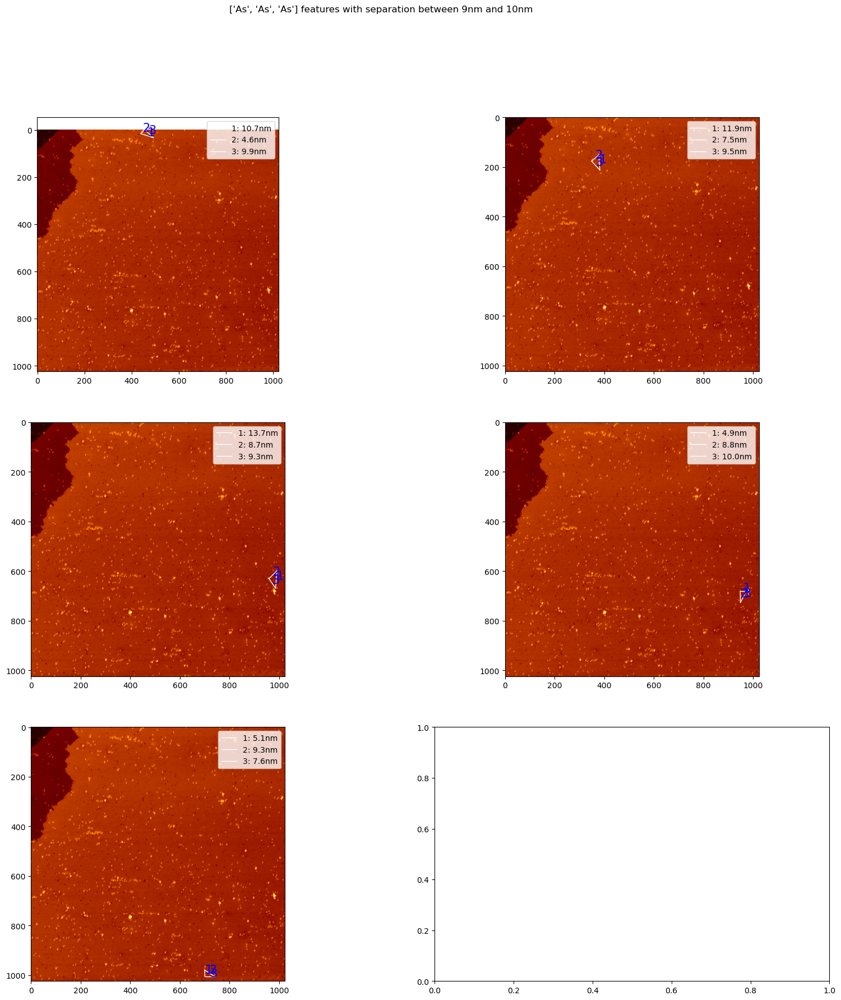

In [241]:
# find all As dopnats that are at a distance of 15nm-20nm from each other
As_to_As = trace_down.find_triplets('As', 'As', 'As', max_dist = 10, min_dist = 9, max_angle=100, min_angle=80, display_image=True)
#ic(As_to_As) # print results too


In [330]:
# load desired matrix file and make an STM object from NavigatingTheMatrix file
cwd = Path.cwd() # current working directory

path = cwd / 'hainault_examples' / '20200212-183707_Hainault-Si(001)-H--27_1.Z_mtrx' #pre dose

scan = nvm.STM( str(path) , None, None, None, standard_pix_ratio=1024/200)
    

In [331]:
# clean up the scans

scan.clean_up(scan.trace_up, 'trace up', plane_level=True)
scan.clean_up(scan.retrace_up, 'retrace up', plane_level=True)

scan.clean_up(scan.trace_down, 'trace down', plane_level=True)
scan.clean_up(scan.retrace_down, 'retrace down', plane_level=True)

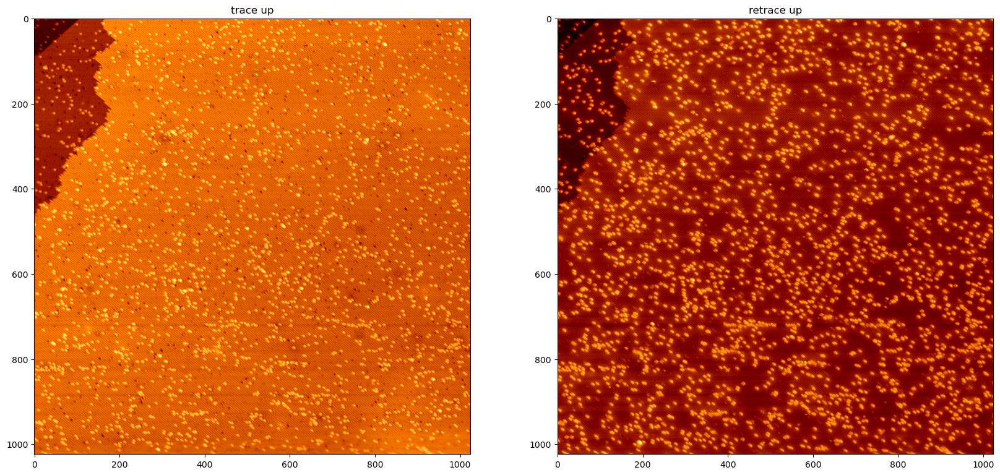

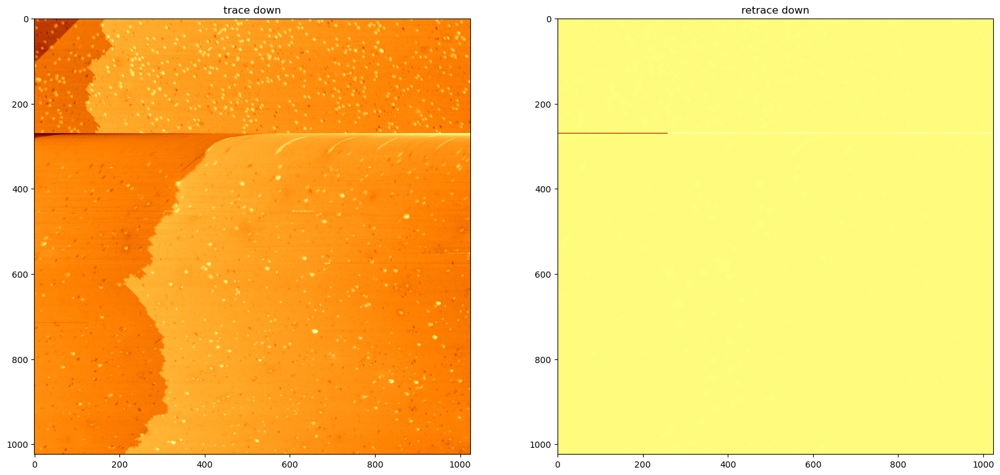

In [251]:
# plot the cleaned up scans and choose whether to use trace up or down
# (Viewing with gwyddion provides better quality images for inspection in my opinion)

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(scan.trace_up_proc, cmap='afmhot')
ax[0].set_title('trace up')
ax[1].imshow(scan.retrace_up_proc, cmap='afmhot')
ax[1].set_title('retrace up')
plt.show()

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(scan.trace_down_proc, cmap='afmhot')
ax[0].set_title('trace down')
ax[1].imshow(scan.retrace_down_proc, cmap='afmhot')
ax[1].set_title('retrace down')
plt.show()

In [332]:
# correct hysteresis
scan.traceup_proc, scan.retrace_up_proc, corrected = scan.correct_hysteresis(scan.trace_up_proc, scan.retrace_up_proc, 'trace up')   
#scan.tracedown_proc, scan.retrace_down_proc, corrected = scan.correct_hysteresis(scan.trace_down_proc, scan.retrace_down_proc, 'trace down')   
   

Number of matches found for hysteresis correction: 256 . If it's only a few (less than ~3) the correction will not be very accurate.


In [333]:
# make a Si_scan object just for trace down
trace_up = asd.Si_Scan(scan, 'trace up', As = False) # As = False if not dosed yet

Resolution of image is 1024


In [334]:
# make detector object to find and label defects
detector = asd.Detector()

In [335]:
# run prediction
trace_up.one_hot_segmented = detector.predict(trace_up, As = False)


Number of features is 2588


In [336]:
# turn output into rgb image
trace_up.rgb = detector.turn_rgb(trace_up.one_hot_segmented)

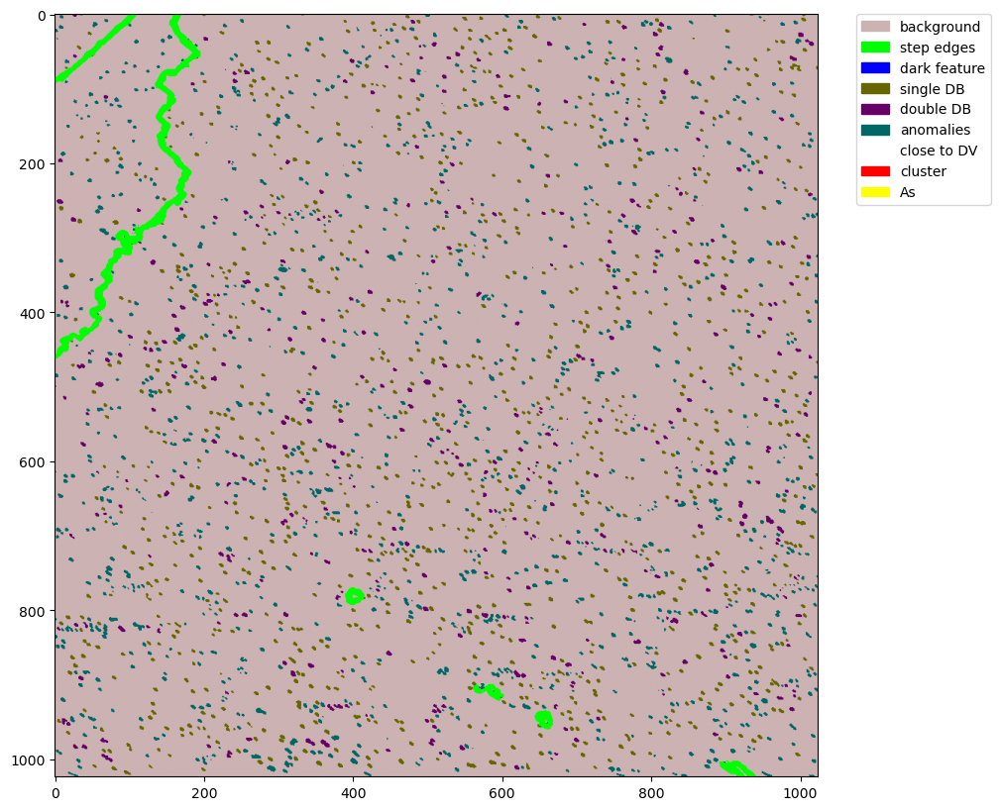

In [337]:
# show image
plt.figure(figsize=(10,10))
plt.imshow(trace_up.rgb)

# Create custom legend handles
legend_handles = []
for rgb, label in detector.legend.items():
    color = np.array(rgb)  # Normalize RGB values to [0, 1] for Matplotlib
    patch = mpatches.Patch(color=color, label=label)
    legend_handles.append(patch)

# Add the custom legend to the plot
plt.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


plt.show()

In [275]:
# find distance between all features then use this to filter for whatever features you want
trace_up.feature_dists()
# all distances are now save in a dictionary which can be accessed by trace_down.features
# keys are the different features in the scan (NOT the feature type). The features are numbered in the order they were found (so keys are 0, 1, 2, 3, etc.)
# values are feature objects (see As_detection.py for more info). Each feature object has things like feature.coord, feature.feature_type




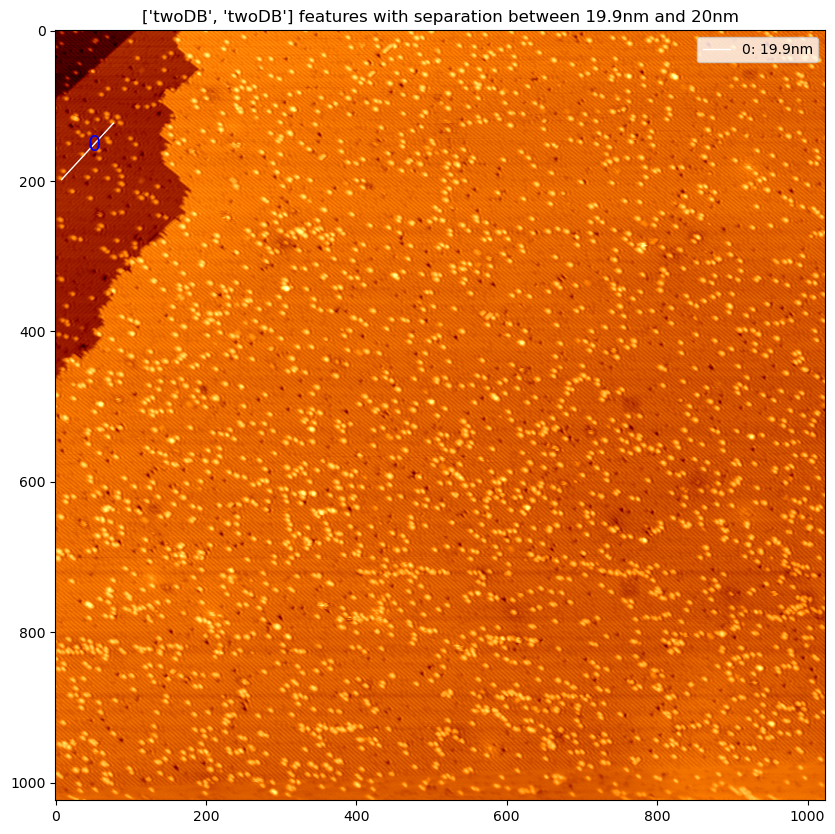

In [284]:
# find all single DBs that are at a distance of 15nm-20nm from each other#
DB_to_DB = trace_up.find_pairs('twoDB', 'twoDB', max_dist = 20, min_dist = 19.9, exclusion_dist=15, display_image=True)


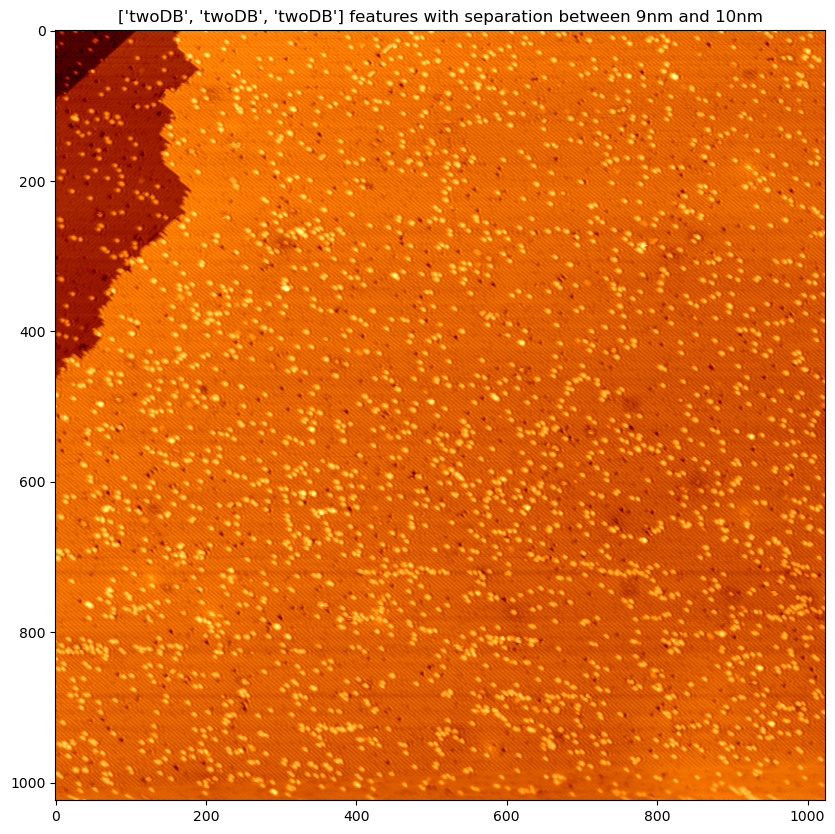

In [294]:
# find all As dopnats that are at a distance of 15nm-20nm from each other
DB_to_DB_to_DB = trace_up.find_triplets('twoDB', 'twoDB', 'twoDB', max_dist = 10, min_dist = 9, max_angle=180, min_angle=80, exclusion_dist=10, display_image=True)
#ic(As_to_As) # print results too


In [338]:
# load desired matrix file and make an STM object from NavigatingTheMatrix file
cwd = Path.cwd() # current working directory

path = cwd / 'hainault_examples' / '20200219-180436_Hainault-Si(001)-H--2_6.Z_mtrx'

scan = nvm.STM( str(path) , None, None, None, standard_pix_ratio=512/100)
    

Pixel to nm ratio is twice as large as desired  trace up fwd . Pixels will be halved so that feature detection can be carried out on surface.
Pixel to nm ratio is twice as large as desired  retrace up . Pixels will be halved so that feature detection can be carried out on surface.
Pixel to nm ratio is twice as large as desired  trace down . Pixels will be halved so that feature detection can be carried out on surface.
Pixel to nm ratio is twice as large as desired  retrace down . Pixels will be halved so that feature detection can be carried out on surface.


In [339]:
# clean up the scans

scan.clean_up(scan.trace_up, 'trace up', plane_level=True)
scan.clean_up(scan.retrace_up, 'retrace up', plane_level=True)

scan.clean_up(scan.trace_down, 'trace down', plane_level=True)
scan.clean_up(scan.retrace_down, 'retrace down', plane_level=True)

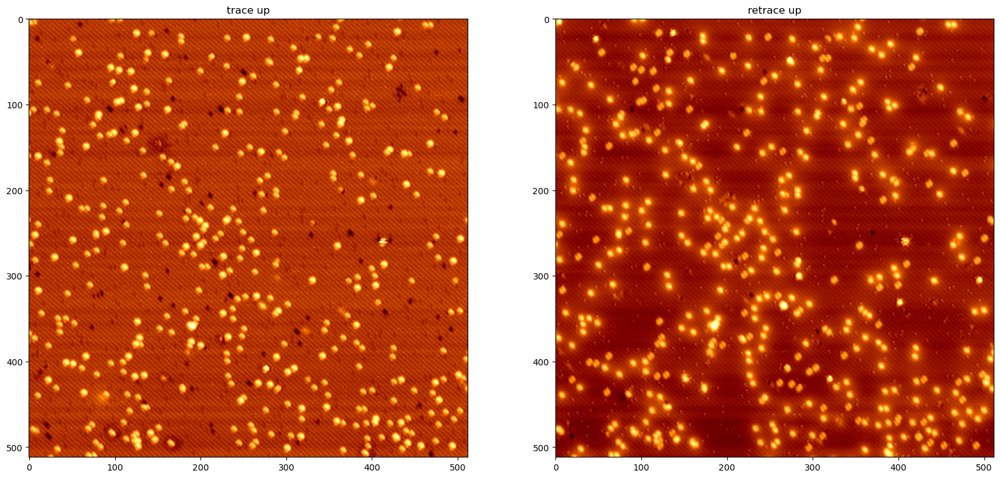

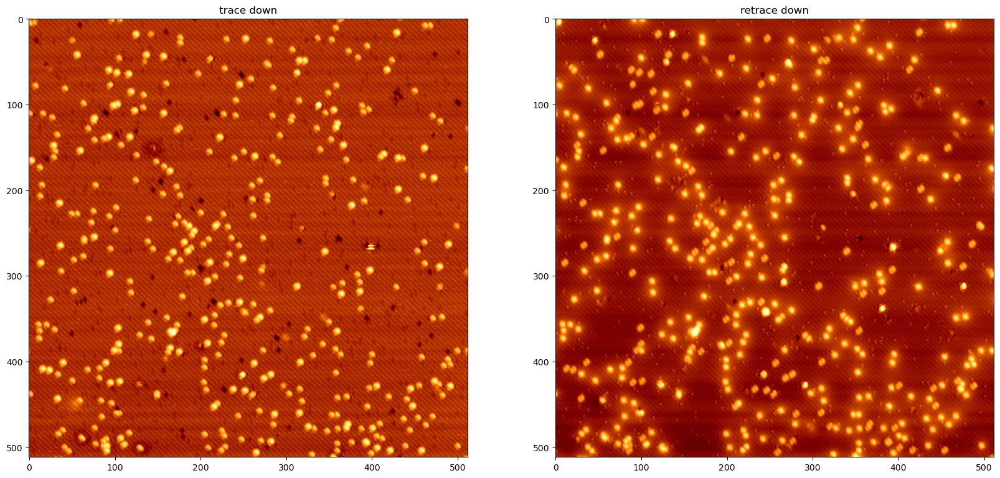

In [340]:
# plot the cleaned up scans and choose whether to use trace up or down
# (Viewing with gwyddion provides better quality images for inspection in my opinion)

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(scan.trace_up_proc, cmap='afmhot')
ax[0].set_title('trace up')
ax[1].imshow(scan.retrace_up_proc, cmap='afmhot')
ax[1].set_title('retrace up')
plt.show()

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(scan.trace_down_proc, cmap='afmhot')
ax[0].set_title('trace down')
ax[1].imshow(scan.retrace_down_proc, cmap='afmhot')
ax[1].set_title('retrace down')
plt.show()

In [341]:
# correct hysteresis
scan.trace_up_proc, scan.retrace_up_proc, corrected = scan.correct_hysteresis(scan.trace_up_proc, scan.retrace_up_proc, 'trace up')   
scan.trace_down_proc, scan.retrace_down_proc, corrected = scan.correct_hysteresis(scan.trace_down_proc, scan.retrace_down_proc, 'trace down')
   

Number of matches found for hysteresis correction: 60 . If it's only a few (less than ~3) the correction will not be very accurate.
Number of matches found for hysteresis correction: 53 . If it's only a few (less than ~3) the correction will not be very accurate.


In [342]:
# make a Si_scan object just for trace down
trace_up = asd.Si_Scan(scan, 'trace up', As=True) # As = False if not dosed yet
trace_down = asd.Si_Scan(scan, 'trace down', As=True)

Resolution of image is 512
Resolution of image is 512


In [353]:
importlib.reload(asd)

<module 'As_detection' from 'c:\\Users\\nkolev\\OneDrive - University College London\\Documents\\GitHub\\NavigatingTheMatrix\\As_detection.py'>

In [354]:
# make detector object to find and label defects
detector = asd.Detector()

In [355]:
# run prediction
trace_down.one_hot_segmented = detector.predict(trace_down, As = False)

Number of features is 379


In [356]:
# turn output into rgb image
trace_down.rgb = detector.turn_rgb(trace_down.one_hot_segmented)

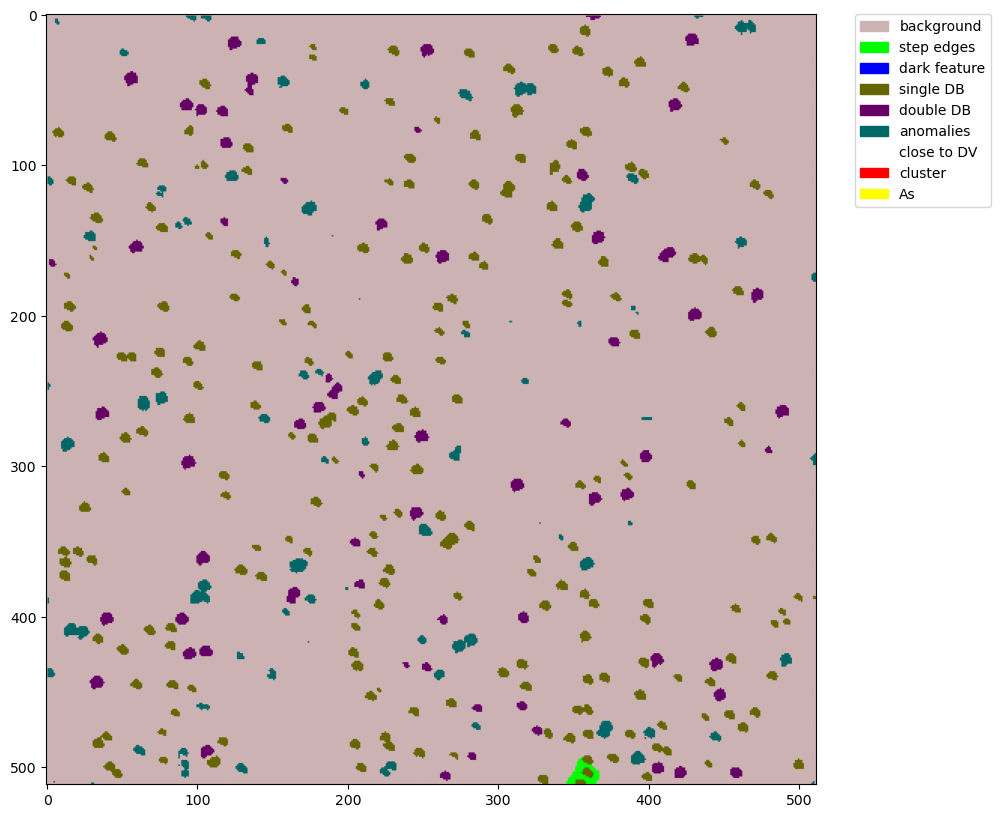

In [357]:
# show image
plt.figure(figsize=(10,10))
plt.imshow(trace_down.rgb)

# order of output2: background, step edges, dv, 1DB, 2DB, anomalies, CDV,  As features (if present)

# Create custom legend handles
legend_handles = []
for rgb, label in detector.legend.items():
    color = np.array(rgb)  # Normalize RGB values to [0, 1] for Matplotlib
    patch = mpatches.Patch(color=color, label=label)
    legend_handles.append(patch)

# Add the custom legend to the plot
plt.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


plt.show()

In [307]:
# find distance between all features then use this to filter for whatever features you want
trace_down.feature_dists()
# all distances are now save in a dictionary which can be accessed by trace_down.features
# keys are the different features in the scan (NOT the feature type). The features are numbered in the order they were found (so keys are 0, 1, 2, 3, etc.)
# values are feature objects (see As_detection.py for more info). Each feature object has things like feature.coord, feature.feature_type
for key in trace_down.features.keys():
    #print('key:', key)
    print('coord: {}, feature type: {}'.format(trace_down.features[key].coord, trace_down.features[key].feature_type))



coord: [ 12 360], feature type: oneDB
coord: [ 24 179], feature type: oneDB
coord: [ 26 233], feature type: oneDB
coord: [ 24 339], feature type: oneDB
coord: [ 26 356], feature type: oneDB
coord: [ 27 283], feature type: oneDB
coord: [ 29 178], feature type: oneDB
coord: [ 33 397], feature type: oneDB
coord: [ 38 310], feature type: oneDB
coord: [ 40 375], feature type: oneDB
coord: [ 47 107], feature type: oneDB
coord: [ 47 386], feature type: oneDB
coord: [ 50 426], feature type: oneDB
coord: [ 60 231], feature type: oneDB
coord: [ 64 315], feature type: oneDB
coord: [ 66 200], feature type: oneDB
coord: [ 72 261], feature type: oneDB
coord: [ 77 162], feature type: oneDB
coord: [80 10], feature type: oneDB
coord: [79 97], feature type: oneDB
coord: [ 80 361], feature type: oneDB
coord: [ 81 287], feature type: oneDB
coord: [83 44], feature type: oneDB
coord: [ 87 351], feature type: oneDB
coord: [ 85 452], feature type: oneDB
coord: [ 90 136], feature type: oneDB
coord: [ 96 244], 

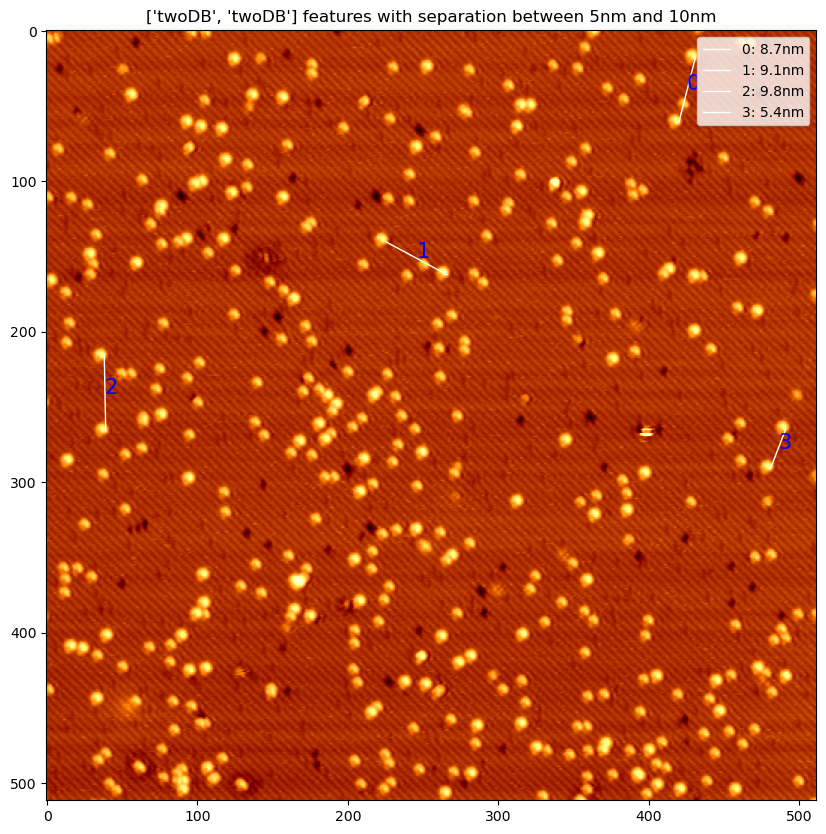

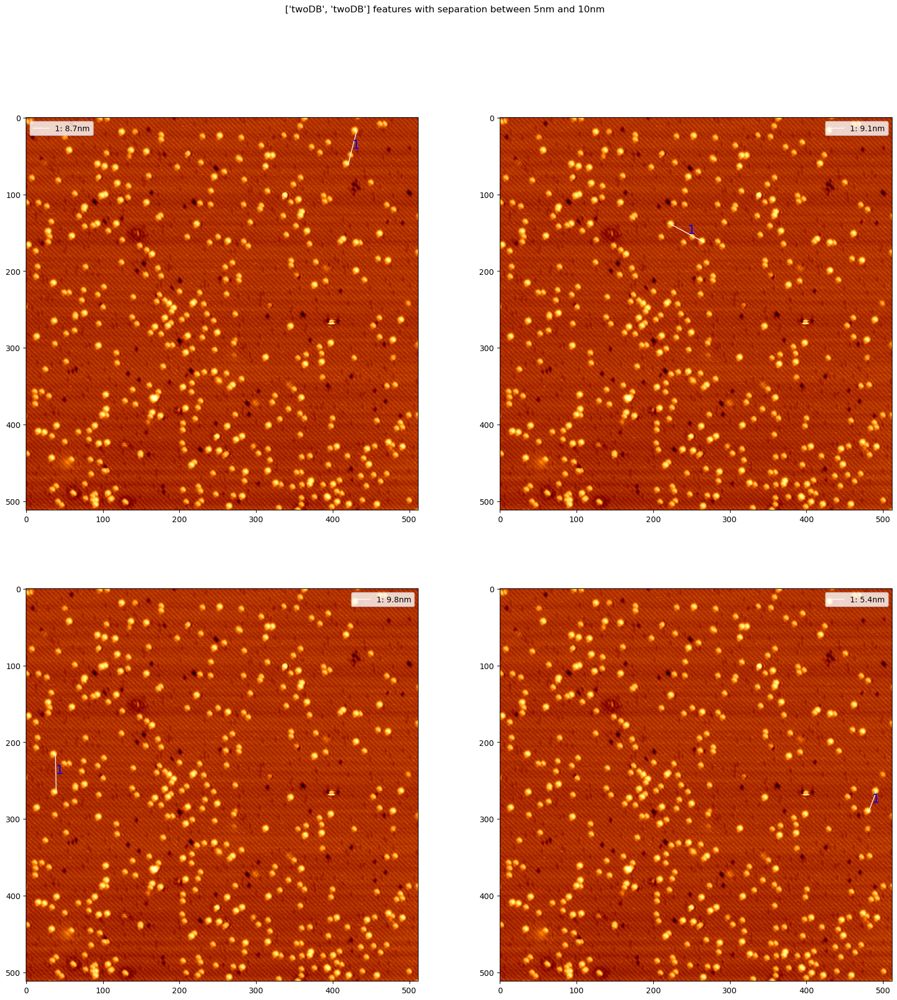

In [310]:
# find all As dopnats that are at a distance of 15nm-20nm from each other
As_to_As = trace_down.find_pairs('twoDB', 'twoDB', max_dist = 10, min_dist = 5, exclusion_dist=10, display_image=True)
#ic(As_to_As) # print results too

# find all As dopnats that are at a distance of 10nm-15nm from a single db
#As_to_db = trace_down.find_pairs('As', 'oneDB', max_dist = 15, min_dist = 10, display_image=True)
#ic(As_to_db) # print results too

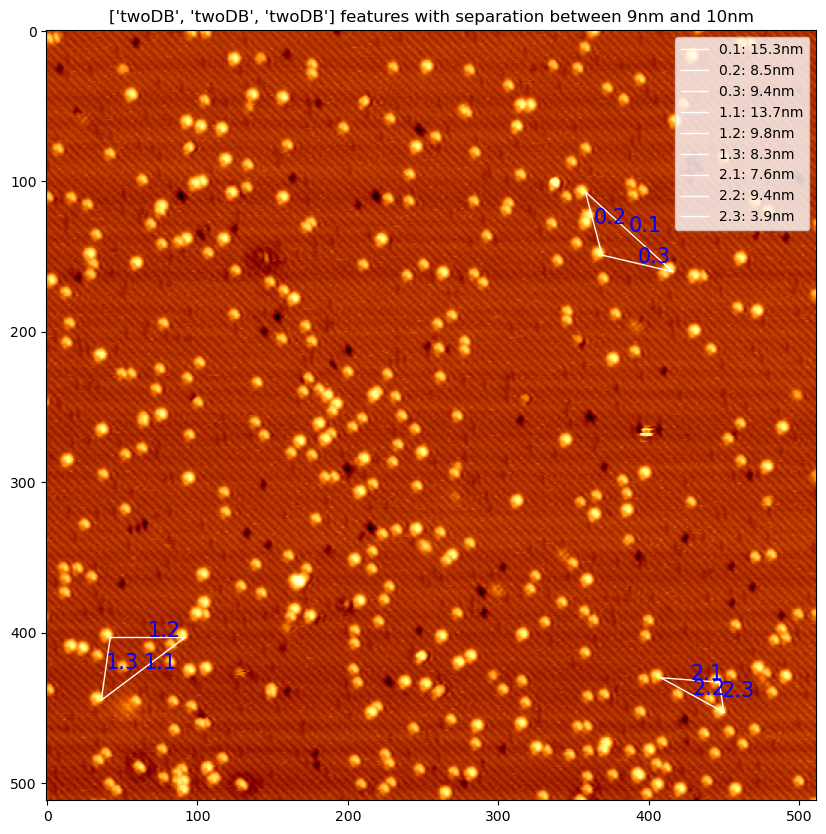

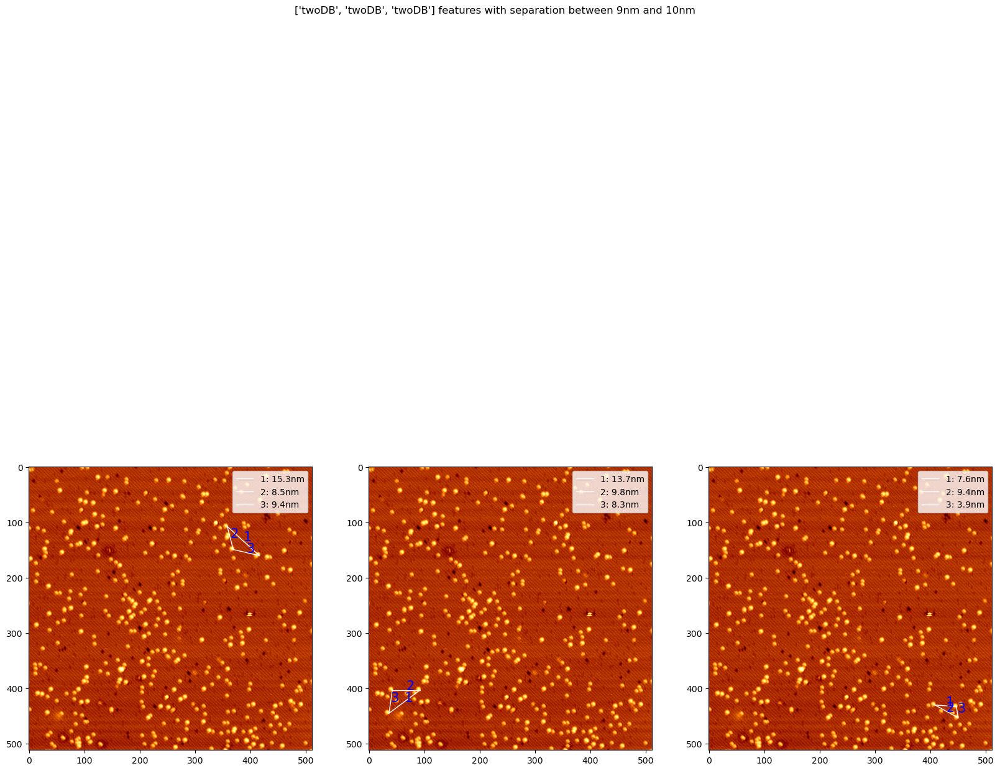

In [320]:
# find all As dopnats that are at a distance of 15nm-20nm from each other
As_to_As = trace_down.find_triplets('twoDB', 'twoDB', 'twoDB', max_dist = 10, min_dist = 9, max_angle=120, min_angle=85, exclusion_dist=8, display_image=True)
#ic(As_to_As) # print results too
